# Importing library and dependencies

In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [3]:
path = glob('C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In [4]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,C:/Users/XIAOMI/Downloads/Automatic-License-Pl...,1093,1396,645,727
1,C:/Users/XIAOMI/Downloads/Automatic-License-Pl...,134,301,312,350
2,C:/Users/XIAOMI/Downloads/Automatic-License-Pl...,31,139,128,161
3,C:/Users/XIAOMI/Downloads/Automatic-License-Pl...,164,316,216,243
4,C:/Users/XIAOMI/Downloads/Automatic-License-Pl...,813,1067,665,724


In [5]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images',filename_image)
    return filepath_image
getFilename(filename)

'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N1.jpeg'

In [6]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]#random check

['C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N1.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N100.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N101.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N102.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N103.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N104.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N105.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N106.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N107.jpeg',
 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/images\\N108.jpeg']

# Verify the data


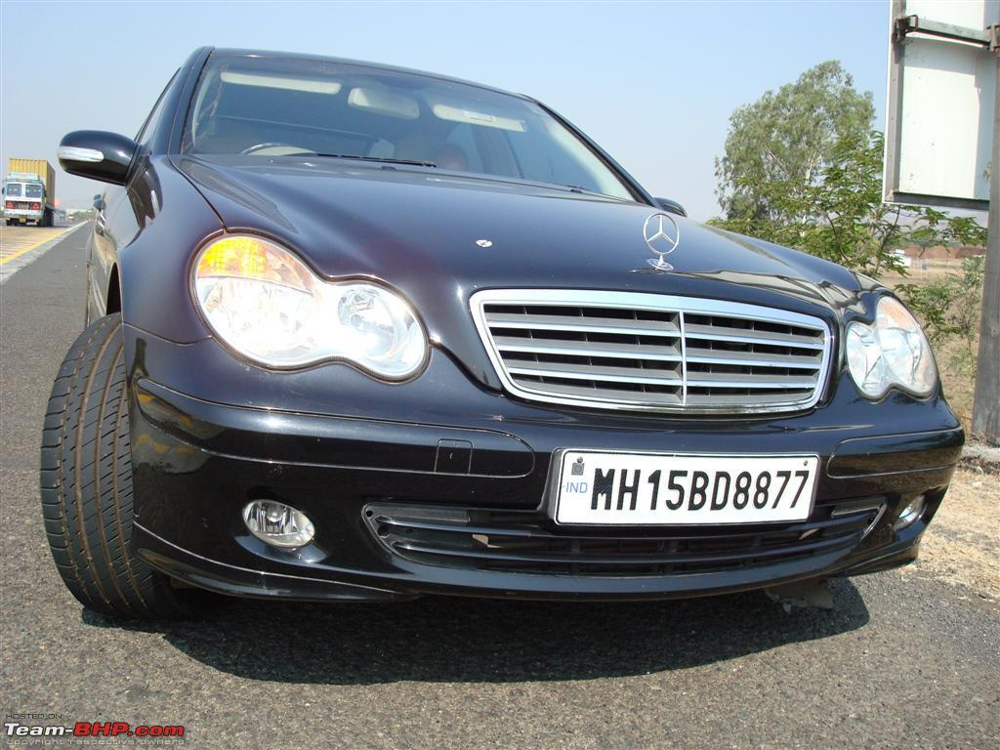

In [7]:
file_path = image_path[87] #path of our image N2.jpeg
img = cv2.imread(file_path) #read the image
# xmin-1804/ymin-1734/xmax-2493/ymax-1882 
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 8 - N2.jpeg with bounding box')
fig.add_shape(type='rect',x0=1804, x1=2493, y0=1734, y1=1882, xref='x', yref='y',line_color='cyan')

# Data Processing

# Read Data

In [8]:
#Targeting all our values in array selecting all columns
labels = df.iloc[:,1:].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

# SPLIT TRAIN AND TEST SET

In [9]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [10]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((180, 224, 224, 3), (45, 224, 224, 3), (180, 4), (45, 4))

# DEEP LEARNING FOR OBJECT DETECTION 

# INCEPTION-RESNET-V2 MODEL BUILDING

In [11]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(224,224,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

In [13]:
# Complie model
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

# RESNET-V2 TRAINING AND SAVE

In [14]:
tfb = TensorBoard('object_detection')
history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=180,
                    validation_data=(x_test,y_test),callbacks=[tfb])

Epoch 1/180
18/18 [==============================] - 103s 4s/step - loss: 0.0414 - val_loss: 0.0390
Epoch 2/180
18/18 [==============================] - 63s 4s/step - loss: 0.0133 - val_loss: 0.0225
Epoch 3/180
18/18 [==============================] - 64s 4s/step - loss: 0.0073 - val_loss: 0.0194
Epoch 4/180
18/18 [==============================] - 77s 4s/step - loss: 0.0052 - val_loss: 0.0156
Epoch 5/180
18/18 [==============================] - 67s 4s/step - loss: 0.0046 - val_loss: 0.0102
Epoch 6/180
18/18 [==============================] - 77s 4s/step - loss: 0.0032 - val_loss: 0.0149
Epoch 7/180
18/18 [==============================] - 71s 4s/step - loss: 0.0034 - val_loss: 0.0103
Epoch 8/180
18/18 [==============================] - 73s 4s/step - loss: 0.0033 - val_loss: 0.0111
Epoch 9/180
18/18 [==============================] - 76s 4s/step - loss: 0.0018 - val_loss: 0.0076
Epoch 10/180
18/18 [==============================] - 73s 4s/step - loss: 0.0018 - val_loss: 0.0080
Epoch 11

In [15]:
model.save('C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/object_detection.h5') # change the path as your machine

In [ ]:
!tensorboard --logdir="C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/object_detection.h5"

# MAKE PREDICTIONS

In [16]:
# Load model
model = tf.keras.models.load_model('C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/object_detection.h5') # adjust the path as your macnine
print('Model loaded Sucessfully')

Model loaded Sucessfully


# Test

In [41]:
path = 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/TEST/TEST1.png' # adjust the path
image = load_img(path) # PIL object
image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
image1 = load_img(path,target_size=(224,224))
image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output

# Size of the orginal image
h,w,d = image.shape
print('Height of the image =',h)
print('Width of the image =',w)

Height of the image = 742
Width of the image = 1200



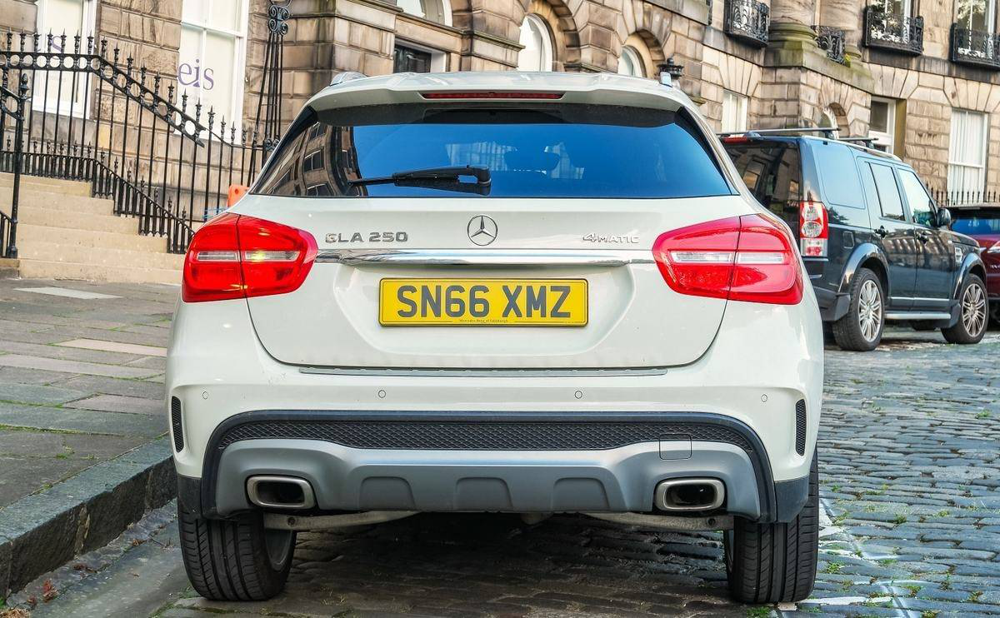

In [42]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

In [43]:
image_arr_224.shape

(224, 224, 3)

In [44]:
test_arr = image_arr_224.reshape(1,224,224,3)
test_arr.shape

(1, 224, 224, 3)

# DE-NORMALIZE THE OUTPUT

In [45]:
# Make predictions
coords = model.predict(test_arr)
coords

1/1 [==============================] - 0s 160ms/step


array([[0.38155112, 0.6033961 , 0.4910233 , 0.5705839 ]], dtype=float32)

In [46]:
# Denormalize the values
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[457.86134005, 724.07534122, 364.33929014, 423.37323892]])

# BOUNDING BOX

In [47]:
coords = coords.astype(np.int32)
coords

array([[457, 724, 364, 423]])

In [48]:
# Draw bounding on top the image
xmin, xmax,ymin,ymax = coords[0]
pt1 =(xmin,ymin)
pt2 =(xmax,ymax)
print(pt1, pt2)

(457, 364) (724, 423)



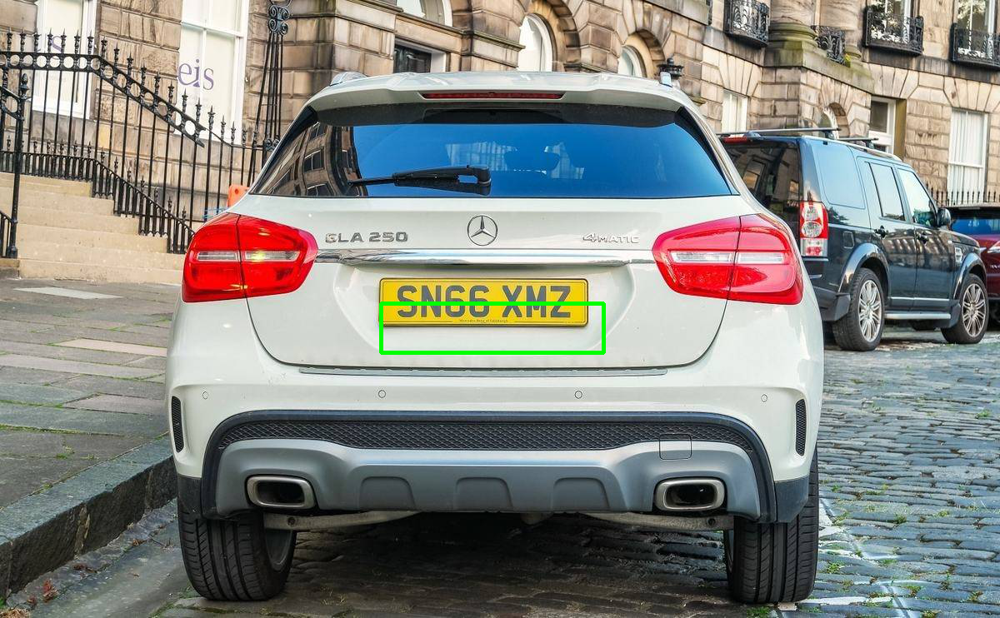

In [51]:
cv2.rectangle(image,pt1,pt2,(0,255,0),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))

# CREATE PIPELINE

1/1 [==============================] - 0s 164ms/step
(457, 364) (724, 423)



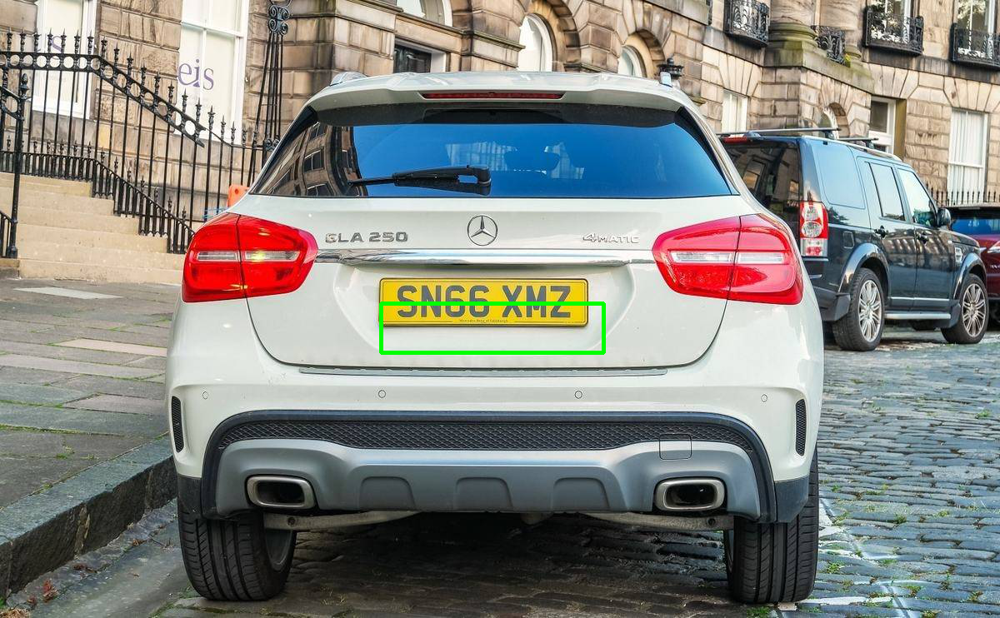

In [55]:
# Create pipeline
path = 'C:/Users/XIAOMI/Downloads/Automatic-License-Plate-Detection-main/TEST/TEST1.png'
def object_detection(path):
    
    # Read image
    image = load_img(path) # PIL object
    image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
    image1 = load_img(path,target_size=(224,224))
    
    # Data preprocessing
    image_arr_224 = img_to_array(image1)/255.0 # Convert to array & normalized
    h,w,d = image.shape
    test_arr = image_arr_224.reshape(1,224,224,3)
    
    # Make predictions
    coords = model.predict(test_arr)
    
    # Denormalize the values
    denorm = np.array([w,w,h,h])
    coords = coords * denorm
    coords = coords.astype(np.int32)
    
    # Draw bounding on top the image
    xmin, xmax,ymin,ymax = coords[0]
    pt1 =(xmin,ymin)
    pt2 =(xmax,ymax)
    print(pt1, pt2)
    cv2.rectangle(image,pt1,pt2,(0,255,0),3)
    return image, coords

image, cods = object_detection(path)

fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

# OCR


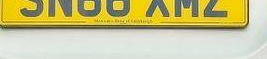

In [28]:
img = np.array(load_img(path))
xmin ,xmax,ymin,ymax = cods[0]
roi = img[ymin:ymax,xmin:xmax]
fig = px.imshow(roi)
fig.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

In [ ]:
# extract text from image
text = pt.image_to_string(roi)
print(text),m